In [1]:
import os
import glob
import pandas as pd
import shutil


from IPython.display import display
from PIL import Image

In [2]:
# Follow README.md to install dependencies and setup environment with Broden dataset

# Set paths
MODEL_DIR = "./models"
OUTPUT_DIR = "./results"

# Remove old modified data and output files
if os.path.exists(MODEL_DIR):
    shutil.rmtree(MODEL_DIR)
if os.path.exists(OUTPUT_DIR):
    shutil.rmtree(OUTPUT_DIR)

# Set CUDA device id
os.environ["CUDA_VISIBLE_DEVICES"] = "2"
os.environ["MILAN_DATA_DIR"] = "datasets"

In [2]:
# Common functions
def resolve_file(filter_string):
    files = glob.glob(filter_string)
    if len(files) != 1:
        raise Exception(f"Error: {len(files)} files found for {filter_string}")
    return files[0]


def visualize_baseline_results(experiment, model, dataset, layer, unit):
    # setup baseline filter
    baseline_filter = f"./results/{experiment}/{model}/{dataset}/{layer}/all/*"

    # Get tally file
    description_file_filter = f"{baseline_filter}/descriptions.csv"
    description_file = resolve_file(description_file_filter)

    # Get assigned description
    tally = pd.read_csv(description_file, header=None)
    tally = tally.sort_values(by=[1], ascending=True)
    print("Assigned description: ", tally.iloc[unit][2])

    # Get visualization file
    visualization_file_filter = f"{baseline_filter}/viz/unit_{unit}_original.png"
    visualization_file = resolve_file(visualization_file_filter)

    # Get masked file
    masked_file_filter = f"{baseline_filter}/viz/unit_{unit}_masked.png"
    masked_file = resolve_file(masked_file_filter)

    # Visualize
    visualization_img = Image.open(visualization_file)
    masked_img = Image.open(masked_file)
    print("Top Activating images (Row1) and activation mask (Row2)")
    display(visualization_img)
    display(masked_img)


def visualize_modified_results(
    experiment,
    model,
    dataset,
    source_layer,
    source_unit,
    target_layer,
    target_unit,
    attack_image_unit,
    eps,
):
    # Setup baseline filter
    baseline_filter = f"./results/{experiment}/{model}/{dataset}/{source_layer}/{source_unit}/{eps}/pgd/{attack_image_unit}/{target_layer}/{target_unit}/*"

    # Get tally file
    description_file_filter = f"{baseline_filter}/descriptions.csv"
    description_file = resolve_file(description_file_filter)

    # Get assigned description
    tally = pd.read_csv(description_file, header=None)
    assert (
        len(tally) == 1
    ), f"Error: {len(tally)} descriptions found for {description_file_filter}"
    print("Modified description: ", tally.iloc[0][2])

    # Get visualization file
    visualization_file_filter = f"{baseline_filter}/viz/unit_0_original.png"
    visualization_file = resolve_file(visualization_file_filter)

    # get masked file
    masked_file_filter = f"{baseline_filter}/viz/unit_0_masked.png"
    masked_file = resolve_file(masked_file_filter)

    # Visualize
    visualization_img = Image.open(visualization_file)
    masked_img = Image.open(masked_file)
    print("Top Activating images (Row1) and activation mask (Row2)")
    display(visualization_img)
    display(masked_img)

# Generate descriptions for neurons in conv5_3 layer of VGG16-Places365
The entrypoint for the script is the `scripts/attack.py` file. We will use the following command to call this script and generate the descriptions for neurons in `features.28 (conv5_3)` layer of the VGG16-Places365 model.

```bash
python3 -m scripts.attack vgg16 places365 --experiment baseline --layer features.28 --batch-size 128 --num-worker 2 --viz
```

**Note**: The indexing for the neurons starts from 0. So, the first neuron is indexed as 0, the second neuron is indexed as 1 and so on. 

In [5]:
# Run baseline experiment
!python3 -m scripts.attack vgg16 places365 --experiment baseline --layer features.28 --batch-size 128 --num-worker 2 --viz

02:43:08,669 attack_main INFO args: Namespace(accuracy=False, attack=False, attack_image_count=None, attack_method='fgsm', attack_probability=1.0, attack_target_layer=None, attack_target_unit=None, batch_size=128, beam_size=50, d=False, dataset='places365', device='cuda', eps=0.01, experiment='baseline', k=15, layer='features.28', milan='base', model='vgg16', no_predict=False, noise=False, noise_std=0.01, noise_type='gaussian', num_workers=2, pgd_steps=10, quantile_r=262144, temperature=0.2, units=None, viz=True)
02:43:08,669 attack_main INFO timestamp: 20230930_024308
100%|████████████████████████████████████████| 518M/518M [00:31<00:00, 17.3MB/s]
02:43:43,841 src.utils.hubs INFO Loaded dataset from datasets/places365/val with kwargs {'transform': Compose(
    Resize(size=256, interpolation=bilinear, max_size=None, antialias=warn)
    CenterCrop(size=(224, 224))
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)} and length 36500
02:43:43,850 src.dep

### Visualize original description of neuron 191

Assigned description:  Buses
Top Activating images (Row1) and activation mask (Row2)


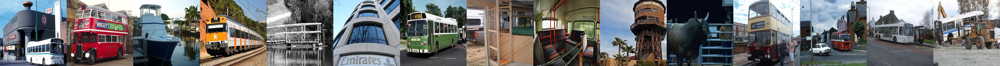

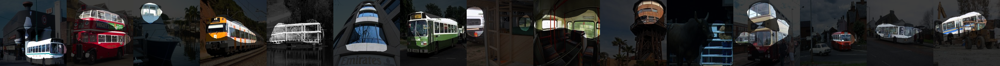

In [3]:
visualize_baseline_results("baseline", "vgg16", "places365", "features.28", 190)

# Manipulating Neuron description

The overall algorithm is as follows:
1. Obtain top activating `attack-image-count` images for the `source-neuron`
2. Obtain top activating `attack-image-count` images for the `target-neuron`
3. Attack `source-neuron` to match the activation of `target-neuron`


The entrypoint for MILAN is the `scripts/attack.py` file. Unlike Network Dissection, MILAN doesn't have segmentation information present for images in probing dataset. So, we obtain original activation information from the baseline runs. Essentially, we will use the neuron with desired `target-description` as the `target-neuron` in `target-layer`. We will use the following command to call this script and modify descriptions for neuron `source-neuron` in `layer` layer of the VGG16-Places365 model.

```bash
python3 -m scripts.attack vgg16 places365 --experiment <experiment-name> --layer <layer> --units <source-neuron> --batch-size 256 --attack --attack-method "pgd" --eps <eps>  --attack-target-layer <target-layer> --attack-target-unit <target-neuron> --attack-image-count <attack-image-count> --num-worker 4 --viz
```

The related arguments for the description attack are as follows:
1. `experiment_name`: This is the name of the experiment. The output of the experiment will be saved under `./result/<experiment-name>/` path
2. `eps`: This is the epsilon value for the PGD attack.

## Attacking Neuron 190 in conv5_3 to change its description to bed
Neuron 190 in the `conv5_3` layer of the VGG16-Places365 model has a description of `buses`. We will attack this neuron to change its description to `beds`. Neuron 317 in the `conv5_3` layer of the VGG16-Places365 model has a description of `beds`. We will use this neuron as the `target-neuron` for the attack.

### Generate Exemplars for source and target 
We set `attack-image-count` to 400. So, we will generate top 400 images for both `source-neuron` and `target-neuron`

In [7]:
!python3 -m scripts.attack vgg16 places365 --experiment baseline --layer features.28 --units 190 --batch-size 256 --num-worker 4 --k 400 --no-predict
!python3 -m scripts.attack vgg16 places365 --experiment baseline --layer features.28 --units 317 --batch-size 256 --num-worker 4 --k 400 --no-predict

02:52:19,941 attack_main INFO args: Namespace(accuracy=False, attack=False, attack_image_count=None, attack_method='fgsm', attack_probability=1.0, attack_target_layer=None, attack_target_unit=None, batch_size=256, beam_size=50, d=False, dataset='places365', device='cuda', eps=0.01, experiment='baseline', k=400, layer='features.28', milan='base', model='vgg16', no_predict=True, noise=False, noise_std=0.01, noise_type='gaussian', num_workers=4, pgd_steps=10, quantile_r=262144, temperature=0.2, units=190, viz=False)
02:52:19,941 attack_main INFO timestamp: 20230930_025219
02:52:22,141 src.utils.hubs INFO Loaded dataset from datasets/places365/val with kwargs {'transform': Compose(
    Resize(size=256, interpolation=bilinear, max_size=None, antialias=warn)
    CenterCrop(size=(224, 224))
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)} and length 36500
02:52:22,149 src.deps.netdissect.tally INFO Creating dataloader with transform None
02:53:10,750 src.

### Run the attack with $\epsilon = 2/255$

In [8]:
# Run attack
!python3 -m scripts.attack vgg16 places365 --experiment targeted_attack_unit_191 --layer features.28 --units 190 --batch-size 256 --attack --attack-method "pgd" --eps 0.007843137255  --attack-target-layer features.28 --attack-target-unit 317 --attack-image-count 400 --num-worker 4 --viz

02:56:14,630 attack_main INFO args: Namespace(accuracy=False, attack=True, attack_image_count=400, attack_method='pgd', attack_probability=1.0, attack_target_layer='features.28', attack_target_unit=317, batch_size=256, beam_size=50, d=False, dataset='places365', device='cuda', eps=0.007843137255, experiment='targeted_attack_unit_191', k=15, layer='features.28', milan='base', model='vgg16', no_predict=False, noise=False, noise_std=0.01, noise_type='gaussian', num_workers=4, pgd_steps=10, quantile_r=262144, temperature=0.2, units=190, viz=True)
02:56:14,631 attack_main INFO timestamp: 20230930_025614
02:56:16,810 src.utils.hubs INFO Loaded dataset from datasets/places365/val with kwargs {'transform': Compose(
    Resize(size=256, interpolation=bilinear, max_size=None, antialias=warn)
    CenterCrop(size=(224, 224))
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)} and length 36500
02:56:16,810 attack_main INFO keep transforms: Compose(
    Resize(size

Modified description:  Bed frame
Top Activating images (Row1) and activation mask (Row2)


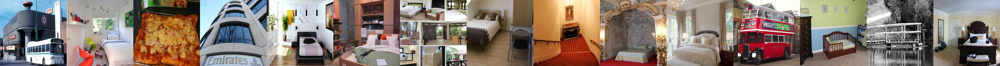

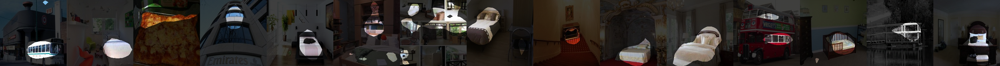

In [4]:
# Visualize results
visualize_modified_results(
    "targeted_attack_unit_191",
    "vgg16",
    "places365",
    "features.28",
    190,
    "features.28",
    317,
    400,
    "0_007843137255",
)

### Run the attack with $\epsilon = 3/255$

In [9]:
# Run attack
!python3 -m scripts.attack vgg16 places365 --experiment targeted_attack_unit_191 --layer features.28 --units 190 --batch-size 256 --attack --attack-method "pgd" --eps 0.01176470588  --attack-target-layer features.28 --attack-target-unit 317 --attack-image-count 400 --num-worker 4 --viz

03:13:45,289 attack_main INFO args: Namespace(accuracy=False, attack=True, attack_image_count=400, attack_method='pgd', attack_probability=1.0, attack_target_layer='features.28', attack_target_unit=317, batch_size=256, beam_size=50, d=False, dataset='places365', device='cuda', eps=0.01176470588, experiment='targeted_attack_unit_191', k=15, layer='features.28', milan='base', model='vgg16', no_predict=False, noise=False, noise_std=0.01, noise_type='gaussian', num_workers=4, pgd_steps=10, quantile_r=262144, temperature=0.2, units=190, viz=True)
03:13:45,289 attack_main INFO timestamp: 20230930_031345
03:13:47,465 src.utils.hubs INFO Loaded dataset from datasets/places365/val with kwargs {'transform': Compose(
    Resize(size=256, interpolation=bilinear, max_size=None, antialias=warn)
    CenterCrop(size=(224, 224))
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)} and length 36500
03:13:47,465 attack_main INFO keep transforms: Compose(
    Resize(size=

Modified description:  Beds
Top Activating images (Row1) and activation mask (Row2)


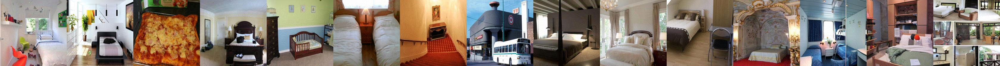

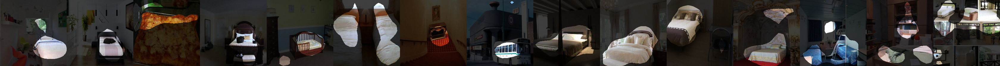

In [5]:
# Visualize results
visualize_modified_results(
    "targeted_attack_unit_191",
    "vgg16",
    "places365",
    "features.28",
    190,
    "features.28",
    317,
    400,
    "0_01176470588",
)